In [52]:
import pandas as pd
import numpy  as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import plugins
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor 
from sklearn.metrics import mean_squared_error,r2_score
from sklearn import metrics

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor 
import xgboost as xgb
import lightgbm as lgb

In [2]:
data=pd.read_csv('./air.csv')

In [3]:
#understand data
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


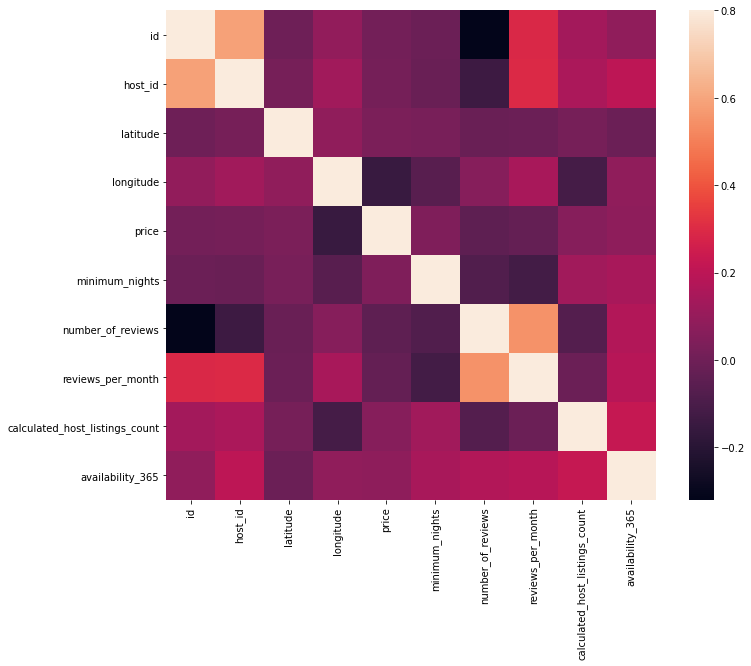

In [4]:
corrmat = data.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

In [5]:
data['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

# Data Viz

In [6]:

#Showing rent price per position in map
rentPriceMap = data[["latitude", "longitude","price"]]
#reduce length of data {CPU dead T_T}
rentPriceMap=rentPriceMap[:10000]

#Map putting start point at new city and zoom at 10
m = folium.Map([40.767937,-73.982155 ], zoom_start=10)

# mark each station as a point
for index, row in rentPriceMap.iterrows():
    #making circle for heat map {adding $ to the price}
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=5,
                        popup=str(row['price'])+'$',
                        fill_color="#3db7e4", 
                       ).add_to(m)
    
    
rentPriceMap = rentPriceMap[['latitude', 'longitude']].to_numpy()
# plot heatmap
m.add_child(plugins.HeatMap(rentPriceMap, radius=25))
m


In [7]:
#FastMarkerCluster(data[['latitude','longitude']],radius=10).add_to(cluster_map)

/home/mehdibalbali/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

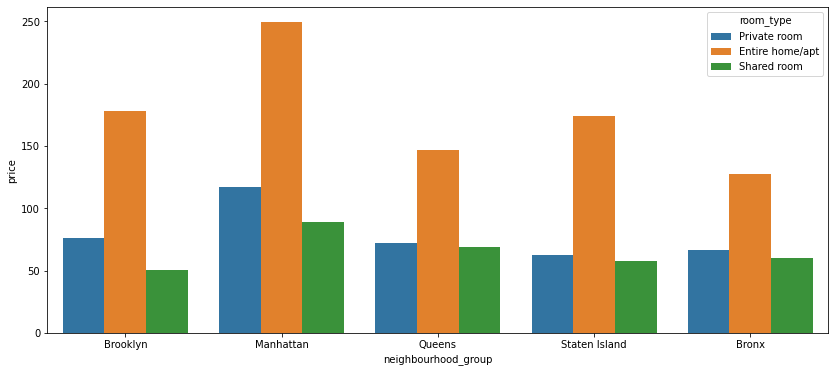

In [8]:
#print price/neighbourhood_group {room_type}
plt.figure(figsize=(14, 6))
sns.barplot(data.neighbourhood_group, data.price, hue=data.room_type, ci=None)

/home/mehdibalbali/.local/lib/python3.8/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():
/home/mehdibalbali/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


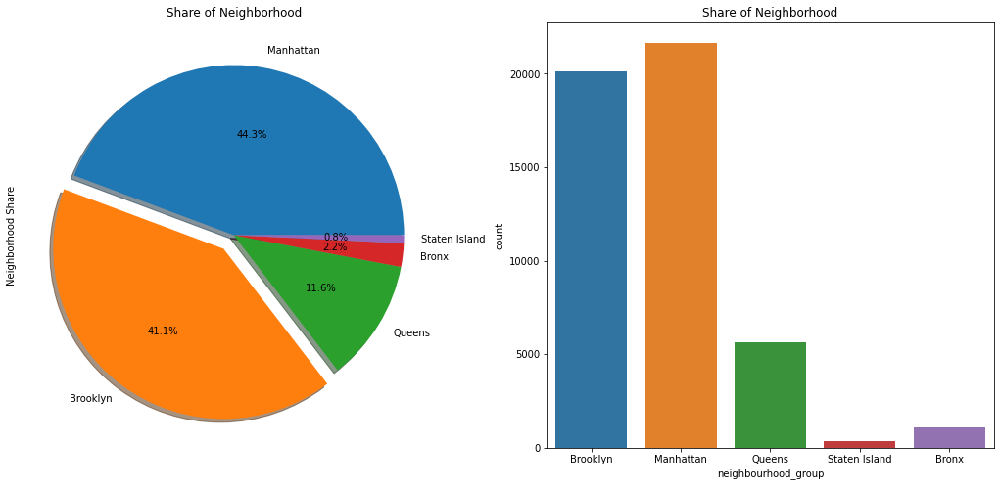

In [9]:
f, ax = plt.subplots(1,2,figsize=(18,8))
data['neighbourhood_group'].value_counts().plot.pie(explode=[0,0.1,0,0,0],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('Share of Neighborhood')
ax[0].set_ylabel('Neighborhood Share')
sns.countplot('neighbourhood_group',data=data,ax=ax[1])
ax[1].set_title('Share of Neighborhood')
plt.show()

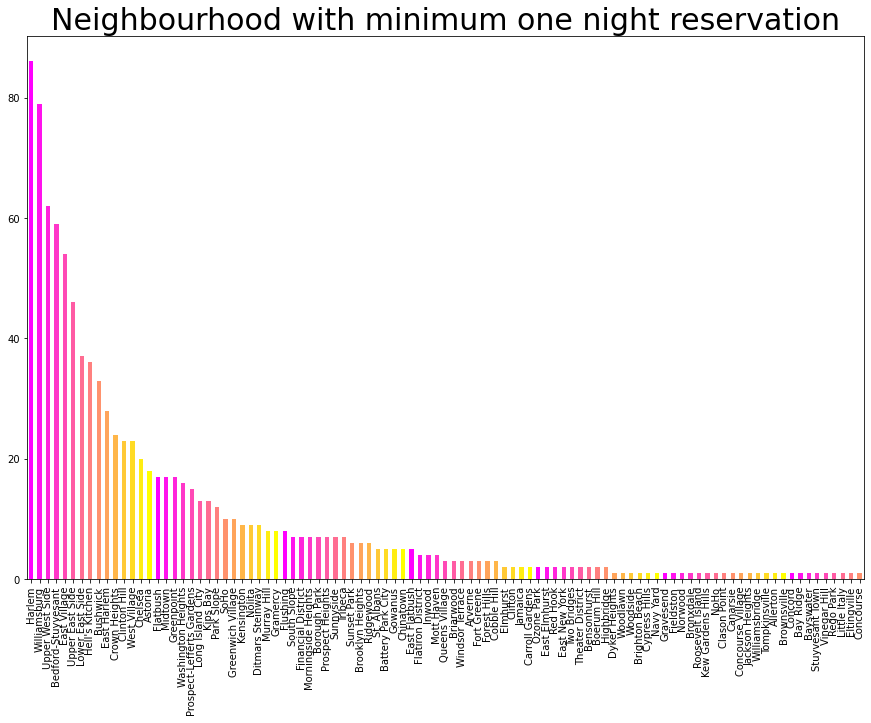

In [10]:
#plot neighbourhood with minimum one night reservation

neighbourhood=data.loc[data['minimum_nights'] == 1]
neighbourhood=neighbourhood['neighbourhood']
color = plt.cm.spring(np.linspace(0, 1, 15))
neighbourhood[:1000].value_counts().plot.bar(color = color, figsize = (15, 10))

plt.title('Neighbourhood with minimum one night reservation',fontsize = 30)

plt.xticks(rotation = 90)
plt.show()

# Data cleaning

In [11]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [12]:
#verifier le nombre de valeurs null dans chaque case 

In [13]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [14]:
dataclean = data[["neighbourhood_group","room_type","minimum_nights","reviews_per_month","number_of_reviews","price"]]
dataclean

,neighbourhood_group,room_type,minimum_nights,reviews_per_month,number_of_reviews,price
0,Brooklyn,Private room,1,0.21,9,149
1,Manhattan,Entire home/apt,1,0.38,45,225
2,Manhattan,Private room,3,NaN,0,150
3,Brooklyn,Entire home/apt,1,4.64,270,89
4,Manhattan,Entire home/apt,10,0.10,9,80
...,...,...,...,...,...,...
48890,Brooklyn,Private room,2,NaN,0,70
48891,Brooklyn,Private room,4,NaN,0,40
48892,Manhattan,Entire home/apt,10,NaN,0,115
48893,Manhattan,Shared room,1,NaN,0,55


In [15]:
#make sure that we don't have NaN columns
dataclean=dataclean.dropna()
dataclean.describe()

,minimum_nights,reviews_per_month,number_of_reviews,price
count,38843.000000,38843.000000,38843.000000,38843.000000
mean,5.868059,1.373221,29.297557,142.317947
std,17.384784,1.680442,48.186374,196.945624
min,1.000000,0.010000,1.000000,0.000000
25%,1.000000,0.190000,3.000000,69.000000
50%,2.000000,0.720000,9.000000,101.000000
75%,4.000000,2.020000,33.000000,170.000000
max,1250.000000,58.500000,629.000000,10000.000000


In [16]:
#verifing 
dataclean.isnull().sum()

neighbourhood_group    0
room_type              0
minimum_nights         0
reviews_per_month      0
number_of_reviews      0
price                  0
dtype: int64

# Feature Engineering

In [17]:
#Encoding neighbourhood_group and room_type
le                                 = preprocessing.LabelEncoder()
dataclean2                         = dataclean
dataclean['neighbourhood_group']  = le.fit_transform(dataclean['neighbourhood_group'])
dataclean2['room_type']            = le.fit_transform(dataclean2['room_type'])

<ipython-input-17-2de5ead116f2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataclean['neighbourhood_group']  = le.fit_transform(dataclean['neighbourhood_group'])
<ipython-input-17-2de5ead116f2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataclean2['room_type']            = le.fit_transform(dataclean2['room_type'])


In [18]:
dataclean2

,neighbourhood_group,room_type,minimum_nights,reviews_per_month,number_of_reviews,price
0,1,1,1,0.21,9,149
1,2,0,1,0.38,45,225
3,1,0,1,4.64,270,89
4,2,0,10,0.10,9,80
5,2,0,3,0.59,74,200
...,...,...,...,...,...,...
48782,2,1,1,1.00,1,129
48790,3,1,1,1.00,1,45
48799,4,1,1,1.00,1,235
48805,0,0,1,2.00,2,100


# Model Tunning

In [19]:
X = dataclean2[[col for col in list(dataclean2.columns) if col != 'price'] ]
y = dataclean2['price']
X_train, X_test, Y_train, Y_test = train_test_split(X,y,random_state = 42, test_size = 0.3) 

In [20]:
dataclean2.head()

,neighbourhood_group,room_type,minimum_nights,reviews_per_month,number_of_reviews,price
0,1,1,1,0.21,9,149
1,2,0,1,0.38,45,225
3,1,0,1,4.64,270,89
4,2,0,10,0.10,9,80
5,2,0,3,0.59,74,200


In [21]:
lin_model = LinearRegression().fit(X_train, Y_train)
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))
print("\n")

# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))

The model performance for training set
--------------------------------------
RMSE is 189.75682396508296
R2 score is 8.018157335227027


The model performance for testing set
--------------------------------------
RMSE is 186.42797814638607
R2 score is 8.400587479608813


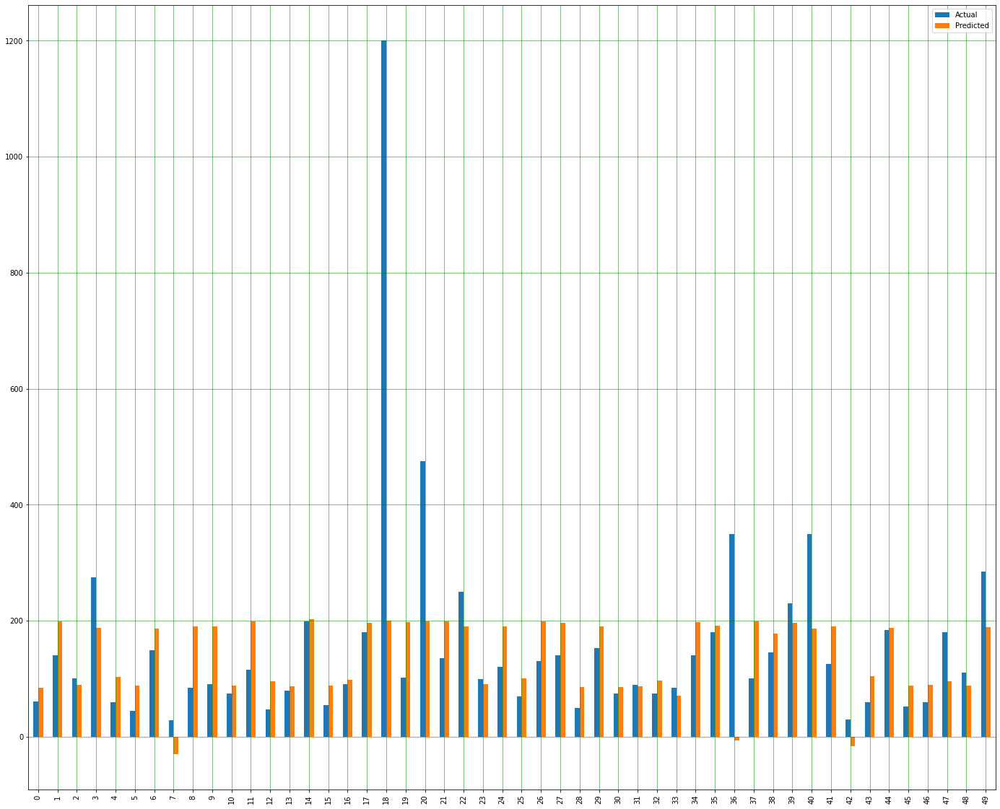

In [22]:
error_frame = pd.DataFrame({'Actual': np.array(Y_test).flatten(), 'Predicted': y_test_predict.flatten()})
df1 = error_frame[:50]
df1.plot(kind='bar',figsize=(24,20))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

# Model Validation

In [23]:
Q1 = dataclean2.quantile(0.25)
Q3 = dataclean2.quantile(0.75)
IQR = Q3 - Q1
IQR_df = dataclean2[~((dataclean2 < (Q1 - 1.5 * IQR)) |(dataclean2 > (Q3 + 1.5 * IQR))).any(axis=1)]


In [24]:
Y = IQR_df['price']
X = IQR_df[['neighbourhood_group', 'room_type']]
X = preprocessing.normalize(X)
X = np.hstack((np.ones( (len(IQR_df['price']) ,1)), X))


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)

In [29]:
lin_model = LinearRegression().fit(X_train, Y_train)
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))
print("\n")

# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))

The model performance for training set
--------------------------------------
RMSE is 52.11622466912023
R2 score is 36.98426923724022


The model performance for testing set
--------------------------------------
RMSE is 51.74053605247789
R2 score is 38.94192544190611


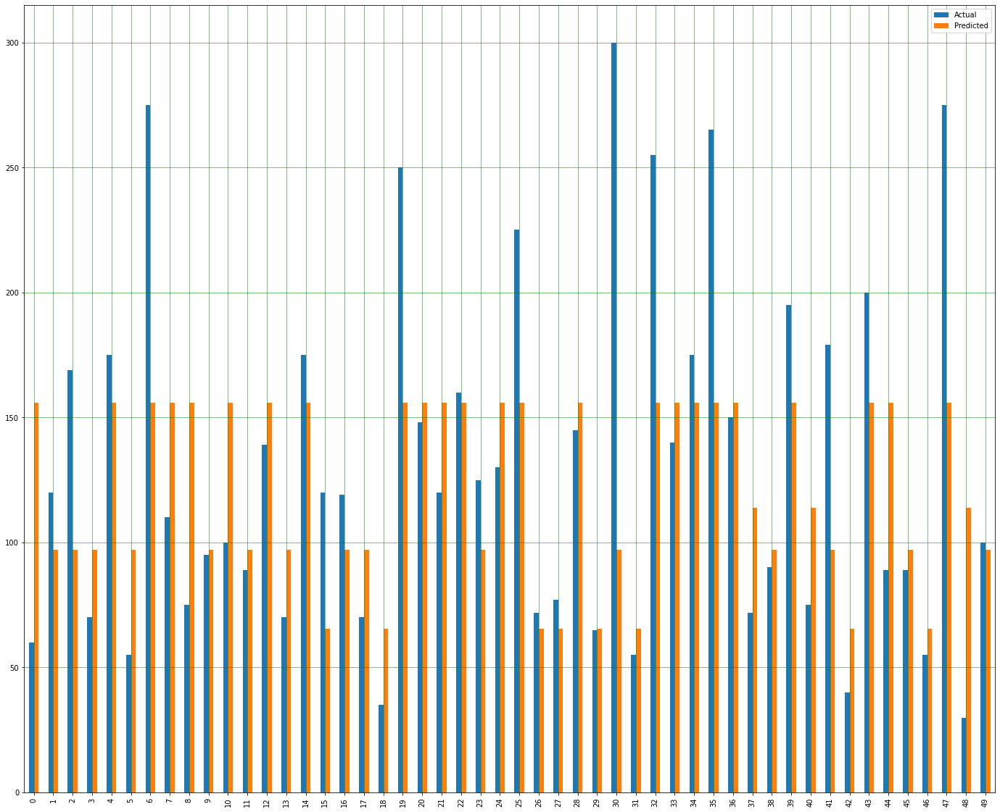

In [26]:
error_frame = pd.DataFrame({'Actual': np.array(Y_test).flatten(), 'Predicted': y_test_predict.flatten()})
df1 = error_frame[:50]
df1.plot(kind='bar',figsize=(24,20))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [69]:
clf = LogisticRegression(random_state=42,max_iter=1000).fit(X_train, Y_train)

In [70]:
y_train_predict = clf.predict(X_train)
clf.score(X_train, Y_train)

0.07082893710720675

In [71]:
predictions = lin_model.predict(X_test)

In [72]:
mae = metrics.mean_absolute_error(Y_test, predictions)
mse = metrics.mean_squared_error(Y_test, predictions)
rmse = np.sqrt(metrics.mean_squared_error(Y_test, predictions))
r2 = metrics.r2_score(Y_test, predictions)

print('MAE (Mean Absolute Error): %s' %mae)
print('MSE (Mean Squared Error): %s' %mse)
print('RMSE (Root mean squared error): %s' %rmse)
print('R2 score: %s' %r2)

MAE (Mean Absolute Error): 40.007353150978346
MSE (Mean Squared Error): 2773.8285966709977
RMSE (Root mean squared error): 52.66714912230391
R2 score: 0.36312827606144915


In [73]:
error = pd.DataFrame({'Actual Values': np.array(Y_test).flatten(), 'Predicted Values': predictions.flatten()})
error.head(10)

,Actual Values,Predicted Values
0,50,65.225787
1,90,65.225787
2,46,156.289656
3,75,65.225787
4,115,156.289656
5,90,65.225787
6,200,156.289656
7,75,65.225787
8,150,156.289656
9,79,97.166289


In [44]:
#regression linéere 
model = LinearRegression()
model.fit(X_train, Y_train)
Y_pred = model.predict(X_test)

print('R-Squared ' + str(r2_score(Y_test, Y_pred)))
print('MAE ' + str((mean_absolute_error(Y_test, Y_pred))))
print('MSE ' + str(np.sqrt(mean_squared_error(Y_test, Y_pred))))

R-Squared 0.3894192544190611
MAE 39.079681209824386
MSE 51.74053605247789


In [45]:
#Decision Tree
model = DecisionTreeRegressor()
model.fit(X_train, Y_train)
y_pred1 = model.predict(X_test)

print('R-Squared ' + str(r2_score(Y_test, y_pred1)))
print('MAE ' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE ' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R-Squared 0.4412684020587382
MAE 36.786108619927724
MSE 49.4949611594626


In [46]:
#Random Forest Regressor
model = RandomForestRegressor(n_estimators = 100, random_state = 0) 
model.fit(X_train, Y_train)
y_pred1 = model.predict(X_test)

print('R-Squared ' + str(r2_score(Y_test, y_pred1)))
print('MAE ' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE ' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R-Squared 0.4412326355670433
MAE 36.77843662087732
MSE 49.4965453125644


In [54]:
#XGB Regressor
XGB = xgb.XGBRegressor(colsample_bytree=0.2, gamma=0.0, 
                             learning_rate=0.05, max_depth=6, 
                             min_child_weight=1.5, n_estimators=7200,
                             reg_alpha=0.9, reg_lambda=0.6,
                             subsample=0.2,seed=42)
XGB.fit(X_train, Y_train)
y_pred1 = XGB.predict(X_test)

print('R-Squared ' + str(r2_score(Y_test, y_pred1)))
print('MAE ' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE ' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R-Squared 0.4410470347209894
MAE 36.78912759133435
MSE 49.504765046339145


In [55]:
LightGB = lgb.LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=3461, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
LightGB.fit(X_train, Y_train)
y_pred1 = LightGB.predict(X_test)

print('R-Squared ' + str(r2_score(Y_test, y_pred1)))
print('MAE ' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE ' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R-Squared 0.4412676699093624
MAE 36.78619599730737
MSE 49.49499358799642
